In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from collections import Counter
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import RFE
import matplotlib.pyplot as plt
%matplotlib inline 
from sklearn.ensemble import RandomForestClassifier
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import Ridge
import seaborn as sns
sns.set()
import joblib
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve,auc
from sklearn.metrics import confusion_matrix
from sklearn.naive_bayes import GaussianNB
from scipy.stats import uniform,randint
from tqdm import tqdm
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import f1_score
from sklearn.metrics import precision_recall_curve
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import AdaBoostClassifier
import pickle
import sklearn.preprocessing as preproc 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import math
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras import Model
from tensorflow.keras import Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.layers import Dense, Dropout
from sklearn.model_selection import train_test_split
from tensorflow.keras.losses import MeanSquaredLogarithmicError
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv('WDI_5K_OHC_New.csv')

In [3]:
df.head()

,Country Name_Africa Eastern and Southern,Country Name_Africa Western and Central,Country Name_Angola,Country Name_Benin,Country Name_Botswana,Country Name_Burkina Faso,Country Name_Burundi,Country Name_Cameroon,Country Name_Central African Republic,Country Name_Chad,...,2002,2017,2019,2003,2016,2008,1996,2001,1995,1999
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.160150e+01,4.009216e+01,4.407391e+01,2.254831e+01,3.873335e+01,2.591396e+01,2.145996e+11,1.998622e+01,2.035338e+11,2.359691e+11
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.489773e+11,5.527889e+11,6.642366e+11,2.652210e+11,5.490720e+11,3.633168e+11,2.145996e+11,2.460002e+11,2.035338e+11,2.359691e+11
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.991569e+11,7.990937e+11,8.541107e+11,4.191231e+11,7.989411e+11,5.164232e+11,2.145996e+11,2.460002e+11,2.035338e+11,2.359691e+11
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.489773e+11,-2.568358e+00,-5.427638e-01,2.323504e+00,5.543908e+00,-5.548173e+00,2.145996e+11,2.460002e+11,2.035338e+11,2.359691e+11
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9.442113e+02,1.262898e+03,1.280060e+03,9.661501e+02,1.296188e+03,1.041703e+03,2.145996e+11,2.460002e+11,2.035338e+11,2.359691e+11


In [4]:
df.corr()

,Country Name_Africa Eastern and Southern,Country Name_Africa Western and Central,Country Name_Angola,Country Name_Benin,Country Name_Botswana,Country Name_Burkina Faso,Country Name_Burundi,Country Name_Cameroon,Country Name_Central African Republic,Country Name_Chad,...,2002,2017,2019,2003,2016,2008,1996,2001,1995,1999
Country Name_Africa Eastern and Southern,1.000000,-0.018868,-0.018868,-0.018868,-0.018868,-0.018868,-0.018868,-0.018868,-0.018868,-0.018868,...,-0.005165,-0.006187,-0.006862,-0.005460,-0.006461,-0.006184,-0.005061,-0.005548,-0.005099,-0.005184
Country Name_Africa Western and Central,-0.018868,1.000000,-0.018868,-0.018868,-0.018868,-0.018868,-0.018868,-0.018868,-0.018868,-0.018868,...,-0.006403,-0.006508,-0.007150,-0.006521,-0.006623,-0.006972,-0.006567,-0.006773,-0.006397,-0.006820
Country Name_Angola,-0.018868,-0.018868,1.000000,-0.018868,-0.018868,-0.018868,-0.018868,-0.018868,-0.018868,-0.018868,...,-0.008134,-0.008055,-0.007344,-0.008930,-0.007352,-0.010625,-0.006398,-0.008722,-0.006417,-0.007451
Country Name_Benin,-0.018868,-0.018868,-0.018868,1.000000,-0.018868,-0.018868,-0.018868,-0.018868,-0.018868,-0.018868,...,-0.004201,-0.005379,-0.005504,-0.007299,-0.005111,-0.005288,-0.005017,-0.004354,-0.004324,-0.004861
Country Name_Botswana,-0.018868,-0.018868,-0.018868,-0.018868,1.000000,-0.018868,-0.018868,-0.018868,-0.018868,-0.018868,...,-0.011199,-0.010326,-0.010513,-0.009996,-0.009954,-0.010734,-0.011327,-0.009741,-0.011308,-0.009781
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2008,-0.006184,-0.006972,-0.010625,-0.005288,-0.010734,-0.006561,-0.009081,0.002880,-0.010046,-0.004512,...,0.975963,0.916701,0.902555,0.978552,0.917446,1.000000,0.960953,0.971906,0.954898,0.965460
1996,-0.005061,-0.006567,-0.006398,-0.005017,-0.011327,-0.005545,-0.008528,0.000608,-0.006478,-0.005584,...,0.995033,0.857373,0.840436,0.992730,0.861302,0.960953,1.000000,0.997058,0.993332,0.998489
2001,-0.005548,-0.006773,-0.008722,-0.004354,-0.009741,-0.004556,-0.008418,0.001347,-0.006480,-0.005778,...,0.998684,0.873630,0.858025,0.997609,0.876915,0.971906,0.997058,1.000000,0.990477,0.998382
1995,-0.005099,-0.006397,-0.006417,-0.004324,-0.011308,-0.005531,-0.008357,0.002610,-0.006421,-0.005128,...,0.988382,0.848764,0.831249,0.986637,0.852878,0.954898,0.993332,0.990477,1.000000,0.991723


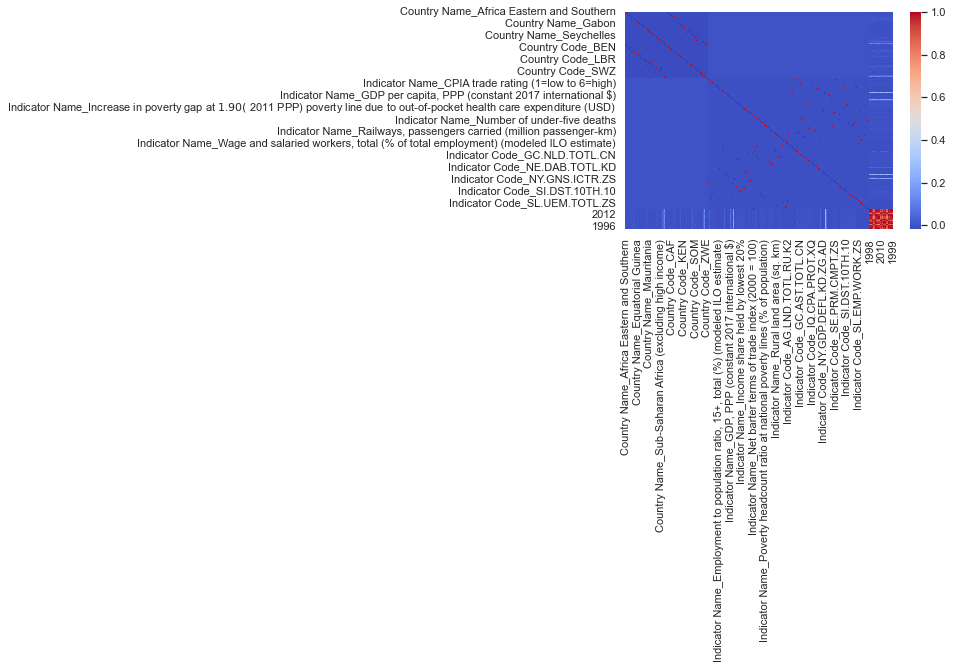

In [5]:
plt.figure()
sns.heatmap(df.corr(),cmap='coolwarm')
plt.show()

In [6]:
#Create Correloation Matrix to express relationship between the variables

corr = df.corr()
corr.style.background_gradient(cmap='coolwarm')

In [9]:
#Apply pre-processing to data using Standard Scaler to make data comparative before applying PCA 
#to ensure that all input features have a similar scale and to avoid bias towards features with larger magnitudes
# if one feature is measured in the range of 0 to 1, and another feature is measured in the range of 0 to 10, then
#the latter feature will have a much larger influence on the outcome of a machine learning model

#Standard Scaling


scaler1 = preproc.StandardScaler()
d = scaler1.fit_transform(df)
X_scaled_stan = pd.DataFrame(d, columns=df.columns)

#all standard deviations are 1
X_scaled_stan.head()

,Country Name_Africa Eastern and Southern,Country Name_Africa Western and Central,Country Name_Angola,Country Name_Benin,Country Name_Botswana,Country Name_Burkina Faso,Country Name_Burundi,Country Name_Cameroon,Country Name_Central African Republic,Country Name_Chad,...,2002,2017,2019,2003,2016,2008,1996,2001,1995,1999
0,7.28011,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,...,-1.177633e-01,-1.148238e-01,-1.238927e-01,-1.200560e-01,-1.194835e-01,-1.213861e-01,5.533346e-17,-1.226117e-01,7.761623e-17,3.301344e-17
1,7.28011,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,...,-2.886889e-17,1.014245e-16,1.821474e-16,-1.381422e-17,-6.640929e-17,1.019609e-16,5.533346e-17,-1.521061e-17,7.761623e-17,3.301344e-17
2,7.28011,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,...,7.103313e-02,5.116180e-02,3.541511e-02,6.966601e-02,5.437400e-02,5.115366e-02,5.533346e-17,-1.521061e-17,7.761623e-17,3.301344e-17
3,7.28011,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,...,-2.886889e-17,-1.148238e-01,-1.238927e-01,-1.200560e-01,-1.194835e-01,-1.213861e-01,5.533346e-17,-1.521061e-17,7.761623e-17,3.301344e-17
4,7.28011,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,...,-1.177633e-01,-1.148238e-01,-1.238927e-01,-1.200560e-01,-1.194835e-01,-1.213861e-01,5.533346e-17,-1.521061e-17,7.761623e-17,3.301344e-17


In [10]:
X_scaled_stan.tail()

,Country Name_Africa Eastern and Southern,Country Name_Africa Western and Central,Country Name_Angola,Country Name_Benin,Country Name_Botswana,Country Name_Burkina Faso,Country Name_Burundi,Country Name_Cameroon,Country Name_Central African Republic,Country Name_Chad,...,2002,2017,2019,2003,2016,2008,1996,2001,1995,1999
5611,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,...,-0.117761,-0.114823,-0.123892,-0.120054,-0.119483,-0.121385,-0.129699,-0.122610,-0.129411,-0.127632
5612,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,...,-0.117763,-0.114824,-0.123893,-0.120056,-0.119484,-0.121386,-0.129702,-0.122612,-0.129413,-0.127634
5613,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,...,-0.117763,-0.114824,-0.123893,-0.120056,-0.119484,-0.121386,-0.129702,-0.122612,-0.129413,-0.127634
5614,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,...,-0.117763,-0.114824,-0.123893,-0.120056,-0.119484,-0.121386,-0.129702,-0.122612,-0.129413,-0.127634
5615,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,...,-0.117763,-0.114824,-0.123893,-0.120056,-0.119484,-0.121386,-0.129702,-0.122612,-0.129413,-0.127634


In [11]:
#Standard Scaled Data = df1

df1 = X_scaled_stan.copy()

In [12]:
df1.head()

,Country Name_Africa Eastern and Southern,Country Name_Africa Western and Central,Country Name_Angola,Country Name_Benin,Country Name_Botswana,Country Name_Burkina Faso,Country Name_Burundi,Country Name_Cameroon,Country Name_Central African Republic,Country Name_Chad,...,2002,2017,2019,2003,2016,2008,1996,2001,1995,1999
0,7.28011,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,...,-1.177633e-01,-1.148238e-01,-1.238927e-01,-1.200560e-01,-1.194835e-01,-1.213861e-01,5.533346e-17,-1.226117e-01,7.761623e-17,3.301344e-17
1,7.28011,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,...,-2.886889e-17,1.014245e-16,1.821474e-16,-1.381422e-17,-6.640929e-17,1.019609e-16,5.533346e-17,-1.521061e-17,7.761623e-17,3.301344e-17
2,7.28011,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,...,7.103313e-02,5.116180e-02,3.541511e-02,6.966601e-02,5.437400e-02,5.115366e-02,5.533346e-17,-1.521061e-17,7.761623e-17,3.301344e-17
3,7.28011,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,...,-2.886889e-17,-1.148238e-01,-1.238927e-01,-1.200560e-01,-1.194835e-01,-1.213861e-01,5.533346e-17,-1.521061e-17,7.761623e-17,3.301344e-17
4,7.28011,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,-0.137361,...,-1.177633e-01,-1.148238e-01,-1.238927e-01,-1.200560e-01,-1.194835e-01,-1.213861e-01,5.533346e-17,-1.521061e-17,7.761623e-17,3.301344e-17


Text(0, 0.5, 'cumulative explained variance')

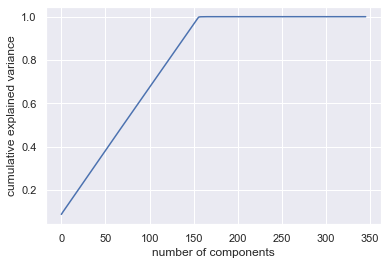

In [14]:
# Principle Component Analysis

#Fit PCA using Standard Scaled Data (df1)

pca1 = PCA().fit(df1)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [18]:
from sklearn.decomposition import PCA
import numpy as np

# assume X is your data matrix
pca1 = PCA(n_components=150)
X_pca = pca1.fit_transform(df1)

# Get the percentage of variance explained by each principal component
variance_ratios = pca1.explained_variance_ratio_

# Print the variance ratios
for i, ratio in enumerate(variance_ratios):
    print("PC{} explains {:.2f}% of the variance".format(i+1, ratio*100))

PC1 explains 8.73% of the variance
PC2 explains 0.66% of the variance
PC3 explains 0.59% of the variance
PC4 explains 0.59% of the variance
PC5 explains 0.59% of the variance
PC6 explains 0.59% of the variance
PC7 explains 0.59% of the variance
PC8 explains 0.59% of the variance
PC9 explains 0.59% of the variance
PC10 explains 0.59% of the variance
PC11 explains 0.59% of the variance
PC12 explains 0.59% of the variance
PC13 explains 0.59% of the variance
PC14 explains 0.59% of the variance
PC15 explains 0.59% of the variance
PC16 explains 0.59% of the variance
PC17 explains 0.59% of the variance
PC18 explains 0.59% of the variance
PC19 explains 0.59% of the variance
PC20 explains 0.59% of the variance
PC21 explains 0.59% of the variance
PC22 explains 0.59% of the variance
PC23 explains 0.59% of the variance
PC24 explains 0.59% of the variance
PC25 explains 0.59% of the variance
PC26 explains 0.59% of the variance
PC27 explains 0.59% of the variance
PC28 explains 0.59% of the variance
P

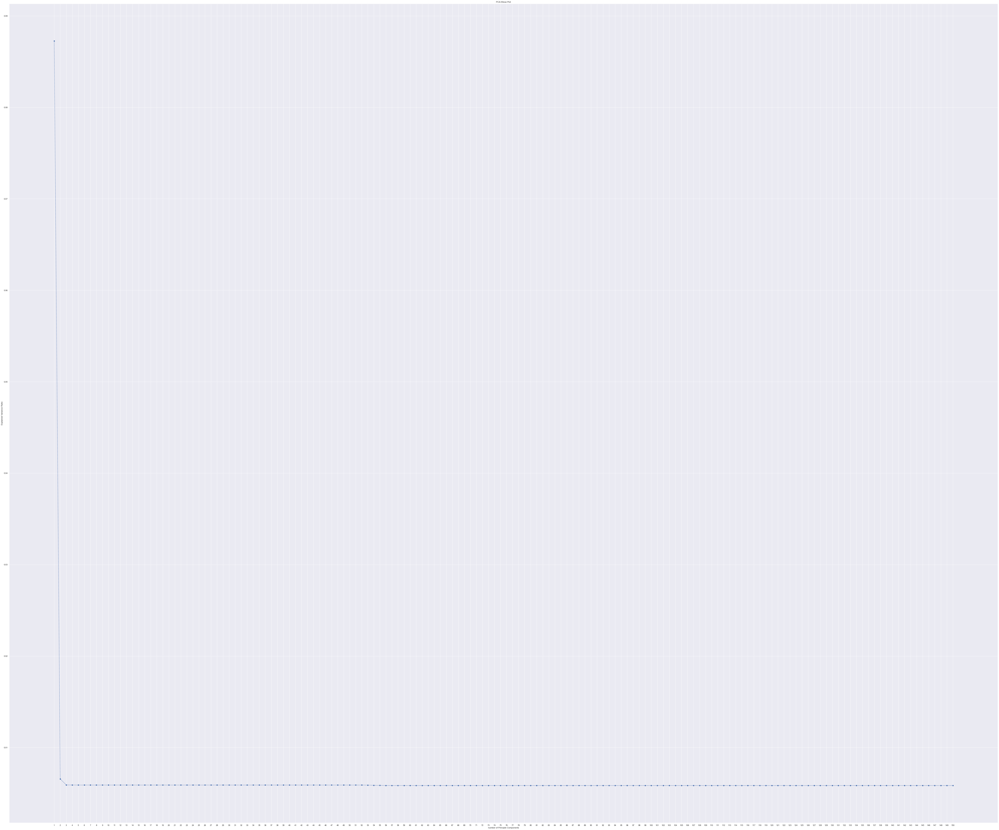

In [19]:
#Plot the Explained Variance Ratio - we can see from the below that there are 17 principle components
# Using Zero value df

plt.figure(figsize=(100,85))
sns.set(style='darkgrid')

plt.plot(range(1, len(pca1.explained_variance_ratio_) +1),
         pca1.explained_variance_ratio_, marker='o', linestyle='--')
plt.xlabel('number of Principle Components')
plt.ylabel('Explained Variance Ratio')
plt.title('PCA Elbow Plot')
plt.xticks(range(1, len(pca1.explained_variance_ratio_) +1))
plt.show();

In [20]:
#Testing Min-Max scaling 


from sklearn.preprocessing import MinMaxScaler

scaler2 = MinMaxScaler()
d = scaler2.fit_transform(df)
X_scaled_MM = pd.DataFrame(d, columns=df.columns)

#all values are now between 0 and 1
X_scaled_MM.head()


,Country Name_Africa Eastern and Southern,Country Name_Africa Western and Central,Country Name_Angola,Country Name_Benin,Country Name_Botswana,Country Name_Burkina Faso,Country Name_Burundi,Country Name_Cameroon,Country Name_Central African Republic,Country Name_Chad,...,2002,2017,2019,2003,2016,2008,1996,2001,1995,1999
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.007859,0.020146,0.029521,0.010897,0.017458,0.003196,0.008882,0.004721,0.010876,0.010025
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.011304,0.024326,0.033827,0.014425,0.021720,0.007105,0.008882,0.008228,0.010876,0.010025
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.013381,0.026189,0.035057,0.016472,0.023660,0.008752,0.008882,0.008228,0.010876,0.010025
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.011304,0.020146,0.029521,0.010897,0.017458,0.003196,0.008882,0.008228,0.010876,0.010025
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.007859,0.020146,0.029521,0.010897,0.017458,0.003196,0.008882,0.008228,0.010876,0.010025


In [21]:
#Min Max Scaled Data = df2

df2_pca1 = X_scaled_MM.copy()

Text(0, 0.5, 'cumulative explained variance')

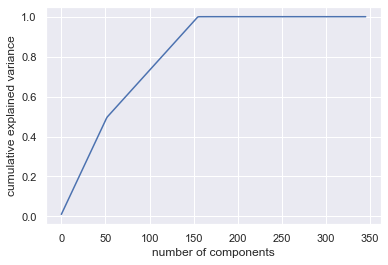

In [22]:
# Principle Component Analysis


#Fit PCA using Min/Max Scaled Data (df2)


pca2 = PCA().fit(df2_pca1)
plt.plot(np.cumsum(pca2.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [23]:
from sklearn.decomposition import PCA
import numpy as np

# assume X is your data matrix
pca2 = PCA(n_components=160)
X_pca_2 = pca2.fit_transform(df2_pca1)

# Get the percentage of variance explained by each principal component
variance_ratios = pca2.explained_variance_ratio_

# Print the variance ratios
for i, ratio in enumerate(variance_ratios):
    print("PC{} explains {:.2f}% of the variance".format(i+1, ratio*100))

PC1 explains 1.02% of the variance
PC2 explains 0.94% of the variance
PC3 explains 0.94% of the variance
PC4 explains 0.94% of the variance
PC5 explains 0.94% of the variance
PC6 explains 0.94% of the variance
PC7 explains 0.94% of the variance
PC8 explains 0.94% of the variance
PC9 explains 0.94% of the variance
PC10 explains 0.94% of the variance
PC11 explains 0.94% of the variance
PC12 explains 0.94% of the variance
PC13 explains 0.94% of the variance
PC14 explains 0.94% of the variance
PC15 explains 0.94% of the variance
PC16 explains 0.94% of the variance
PC17 explains 0.94% of the variance
PC18 explains 0.94% of the variance
PC19 explains 0.94% of the variance
PC20 explains 0.94% of the variance
PC21 explains 0.94% of the variance
PC22 explains 0.94% of the variance
PC23 explains 0.94% of the variance
PC24 explains 0.94% of the variance
PC25 explains 0.94% of the variance
PC26 explains 0.94% of the variance
PC27 explains 0.94% of the variance
PC28 explains 0.94% of the variance
P

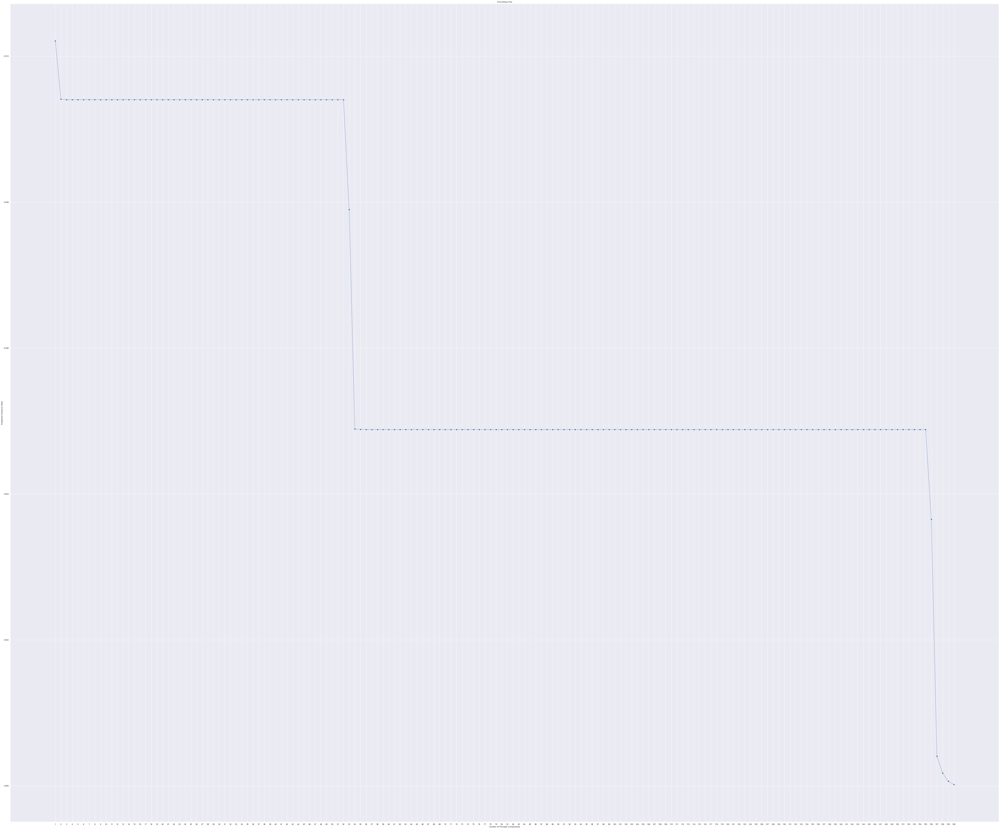

In [24]:
#Plot the Explained Variance Ratio - we can see from the below that there are 17 principle components
# Using Zero value df

plt.figure(figsize=(100,85))
sns.set(style='darkgrid')

plt.plot(range(1, len(pca2.explained_variance_ratio_) +1),
         pca2.explained_variance_ratio_, marker='o', linestyle='--')
plt.xlabel('number of Principle Components')
plt.ylabel('Explained Variance Ratio')
plt.title('PCA Elbow Plot')
plt.xticks(range(1, len(pca2.explained_variance_ratio_) +1))
plt.show();

In [25]:
#Apply pre-processing to data using Robust scaler to make data comparative before applying PCA 


# Robust Scaling


from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()
d = scaler.fit_transform(df)
X_scaled_rob = pd.DataFrame(d, columns=df.columns)

#scaled using robust scaling
X_scaled_rob.head()

,Country Name_Africa Eastern and Southern,Country Name_Africa Western and Central,Country Name_Angola,Country Name_Benin,Country Name_Botswana,Country Name_Burkina Faso,Country Name_Burundi,Country Name_Cameroon,Country Name_Central African Republic,Country Name_Chad,...,2002,2017,2019,2003,2016,2008,1996,2001,1995,1999
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.008666,-0.000001,-0.000489,-0.021785,-0.000020,-0.000042,0.0,-0.101355,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.991334,0.999999,0.999511,0.978215,0.999980,0.999958,0.0,0.898645,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.594520,1.445566,1.285364,1.558494,1.455056,1.421371,0.0,0.898645,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.991334,-0.000001,-0.000489,-0.021785,-0.000020,-0.000042,0.0,0.898645,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.008666,-0.000001,-0.000489,-0.021785,-0.000020,-0.000042,0.0,0.898645,0.0,0.0


In [26]:
#Robust Scaled Data = df3

df3 = X_scaled_rob.copy()

Text(0, 0.5, 'cumulative explained variance')

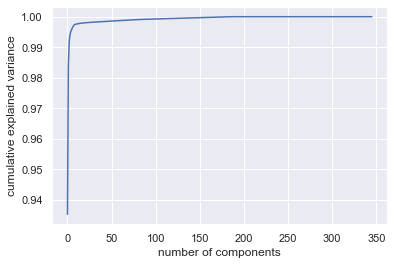

In [27]:
# Principle Component Analysis


#Fit PCA using Robust Scaled Data (df3)


pca3 = PCA().fit(df3)
plt.plot(np.cumsum(pca3.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [28]:
df3.describe()

,Country Name_Africa Eastern and Southern,Country Name_Africa Western and Central,Country Name_Angola,Country Name_Benin,Country Name_Botswana,Country Name_Burkina Faso,Country Name_Burundi,Country Name_Cameroon,Country Name_Central African Republic,Country Name_Chad,...,2002,2017,2019,2003,2016,2008,1996,2001,1995,1999
count,5616.000000,5616.000000,5616.000000,5616.000000,5616.000000,5616.000000,5616.000000,5616.000000,5616.000000,5616.000000,...,5616.000000,5616.000000,5616.000000,5616.000000,5616.000000,5616.000000,5.616000e+03,5.616000e+03,5.616000e+03,5.616000e+03
mean,0.018519,0.018519,0.018519,0.018519,0.018519,0.018519,0.018519,0.018519,0.018519,0.018519,...,0.991334,0.999999,0.999511,0.978215,0.999980,0.999958,-4.608137e-16,8.986454e-01,-4.260599e-16,-2.951501e-16
std,0.134829,0.134829,0.134829,0.134829,0.134829,0.134829,0.134829,0.134829,0.134829,0.134829,...,8.492368,8.709768,8.072219,8.330185,8.370099,8.238909,7.710689e+00,8.156552e+00,7.727869e+00,7.835613e+00
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-2.290008,-4.818753,-6.856227,-3.110453,-4.096504,-0.817664,-2.460643e+00,-1.447868e+00,-3.067342e+00,-2.786417e+00
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-0.008666,-0.000001,-0.000489,-0.021785,-0.000020,-0.000042,-1.000000e+00,-1.013546e-01,-1.000000e+00,-1.000000e+00
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,-7.806256e-18,0.000000e+00,0.000000e+00
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.991334,0.999999,0.999511,0.978215,0.999980,0.999958,0.000000e+00,8.986454e-01,0.000000e+00,0.000000e+00
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,288.001453,234.375889,225.379695,280.342255,230.545579,255.019993,2.745650e+02,2.837542e+02,2.789519e+02,2.751523e+02


In [29]:
from sklearn.decomposition import PCA
import numpy as np

# assume X is your data matrix
pca3 = PCA(n_components=150)
X_pca_3 = pca3.fit_transform(df3)

# Get the percentage of variance explained by each principal component
variance_ratios = pca3.explained_variance_ratio_

# Print the variance ratios
for i, ratio in enumerate(variance_ratios):
    print("PC{} explains {:.2f}% of the variance".format(i+1, ratio*100))

PC1 explains 93.52% of the variance
PC2 explains 4.85% of the variance
PC3 explains 0.84% of the variance
PC4 explains 0.22% of the variance
PC5 explains 0.10% of the variance
PC6 explains 0.07% of the variance
PC7 explains 0.06% of the variance
PC8 explains 0.05% of the variance
PC9 explains 0.03% of the variance
PC10 explains 0.01% of the variance
PC11 explains 0.01% of the variance
PC12 explains 0.01% of the variance
PC13 explains 0.01% of the variance
PC14 explains 0.00% of the variance
PC15 explains 0.00% of the variance
PC16 explains 0.00% of the variance
PC17 explains 0.00% of the variance
PC18 explains 0.00% of the variance
PC19 explains 0.00% of the variance
PC20 explains 0.00% of the variance
PC21 explains 0.00% of the variance
PC22 explains 0.00% of the variance
PC23 explains 0.00% of the variance
PC24 explains 0.00% of the variance
PC25 explains 0.00% of the variance
PC26 explains 0.00% of the variance
PC27 explains 0.00% of the variance
PC28 explains 0.00% of the variance


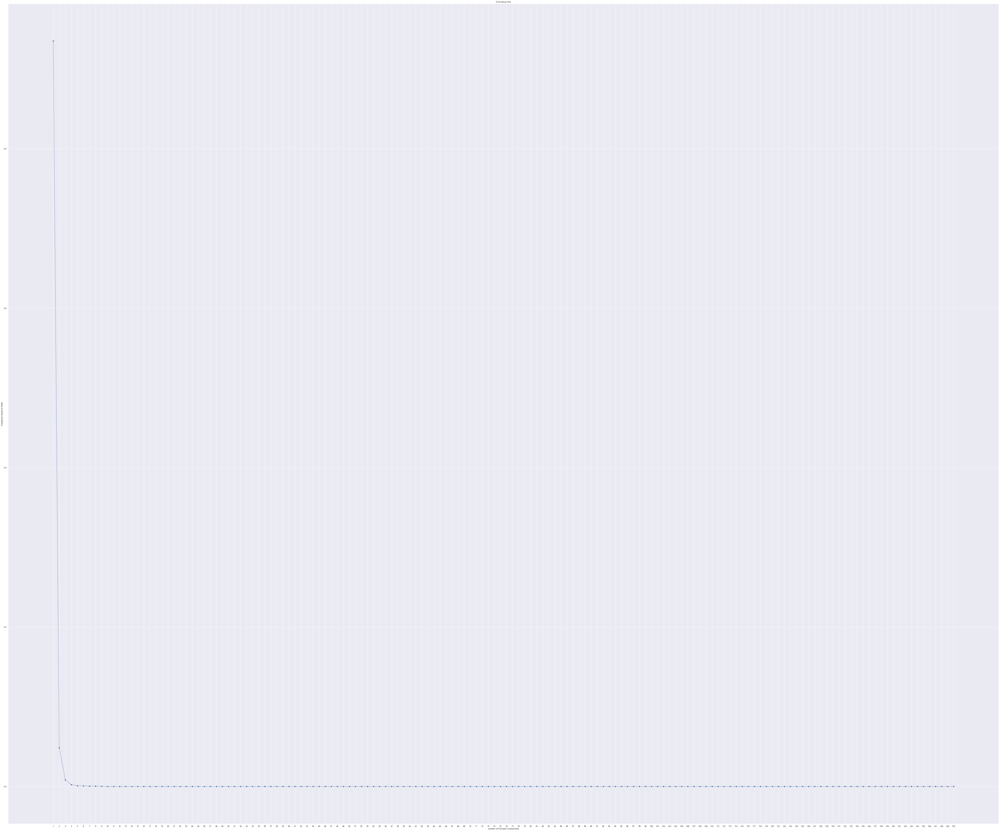

In [30]:
#Plot the Explained Variance Ratio - we can see from the below that there are 17 principle components
# Using Zero value df

plt.figure(figsize=(100,85))
sns.set(style='darkgrid')

plt.plot(range(1, len(pca3.explained_variance_ratio_) +1),
         pca3.explained_variance_ratio_, marker='o', linestyle='--')
plt.xlabel('number of Principle Components')
plt.ylabel('Explained Variance Ratio')
plt.title('PCA Elbow Plot')
plt.xticks(range(1, len(pca3.explained_variance_ratio_) +1))
plt.show();

In [31]:
#PCA


#Fit our defined number of components into a new model by specifying the number we need to include all % of variance
#In this first case we will use the number 18 and our first edited data frame of Zero Positive values

pca4 = PCA(n_components=4)
projected = pca4.fit_transform(df3)

In [32]:
projected.shape

(5616, 4)

In [33]:
df3_pca1 = pd.DataFrame(projected, columns=['C1','C2','C3','C4'])
df3_pca1

,C1,C2,C3,C4
0,-3.857666,-1.391045,1.289596,-0.348264
1,-0.000058,-0.000019,0.000390,0.000303
2,1.672398,0.526033,-0.812707,-0.006557
3,-3.299483,-1.793893,1.389901,0.339093
4,-3.488061,-1.668501,1.383959,0.129250
...,...,...,...,...
5611,-5.636490,0.013238,-0.260378,0.072395
5612,-5.636563,0.013258,-0.260386,0.072393
5613,-5.636563,0.013258,-0.260386,0.072393
5614,-5.214807,0.351602,0.141979,-0.139964


In [34]:
df3_pca1.head()

,C1,C2,C3,C4
0,-3.857666,-1.391045,1.289596,-0.348264
1,-0.000058,-0.000019,0.000390,0.000303
2,1.672398,0.526033,-0.812707,-0.006557
3,-3.299483,-1.793893,1.389901,0.339093
4,-3.488061,-1.668501,1.383959,0.129250


In [35]:
df3_pca1.describe()

,C1,C2,C3,C4
count,5.616000e+03,5.616000e+03,5.616000e+03,5.616000e+03
mean,9.963540e-18,5.224137e-16,1.265508e-16,1.657180e-16
std,4.442836e+01,1.011860e+01,4.210622e+00,2.169378e+00
min,-1.039229e+01,-1.960096e+02,-1.147319e+02,-7.361776e+01
25%,-5.511924e+00,-2.698145e-01,-2.601320e-01,-9.804767e-02
50%,-3.055050e+00,1.568775e-04,-4.956829e-02,6.555840e-02
75%,-5.210136e-01,1.508060e-02,1.427549e-01,9.399920e-02
max,1.430646e+03,5.197924e+02,2.075370e+02,9.303548e+01


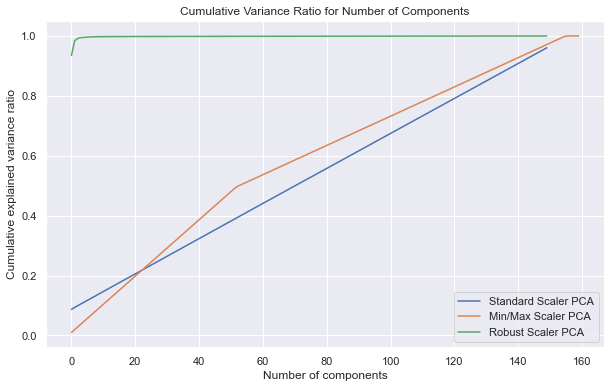

In [45]:
import matplotlib.pyplot as plt

# Create a new figure with size (10, 6)
plt.figure(figsize=(10, 6))

# Plot cumulative explained variance ratio for each PCA
plt.plot(np.cumsum(pca1.explained_variance_ratio_), label='Standard Scaler PCA')
plt.plot(np.cumsum(pca2.explained_variance_ratio_), label='Min/Max Scaler PCA')
plt.plot(np.cumsum(pca3.explained_variance_ratio_), label='Robust Scaler PCA')

# Add axis labels and title
plt.ylabel('Cumulative explained variance ratio')
plt.xlabel('Number of components')
plt.title('Cumulative Variance Ratio for Number of Components')

# Add legend
plt.legend();